1.14.0

156
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv2d_203 (Conv2D)             (None, None, None, 3 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_203 (BatchN (None, None, None, 3 96          conv2d_203[0][0]                 
__________________________________________________________________________________________________
activation_203 (Activation)     (None, None, None, 3 0           batch_normalization_203[0][0]    
________________________________________________________________________________

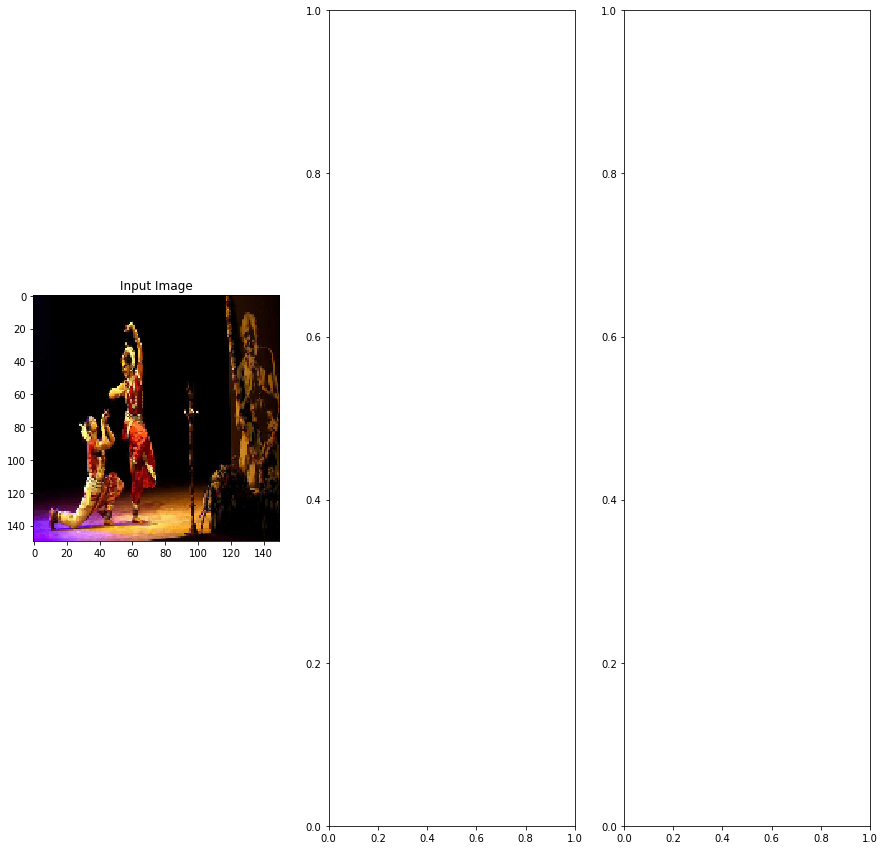

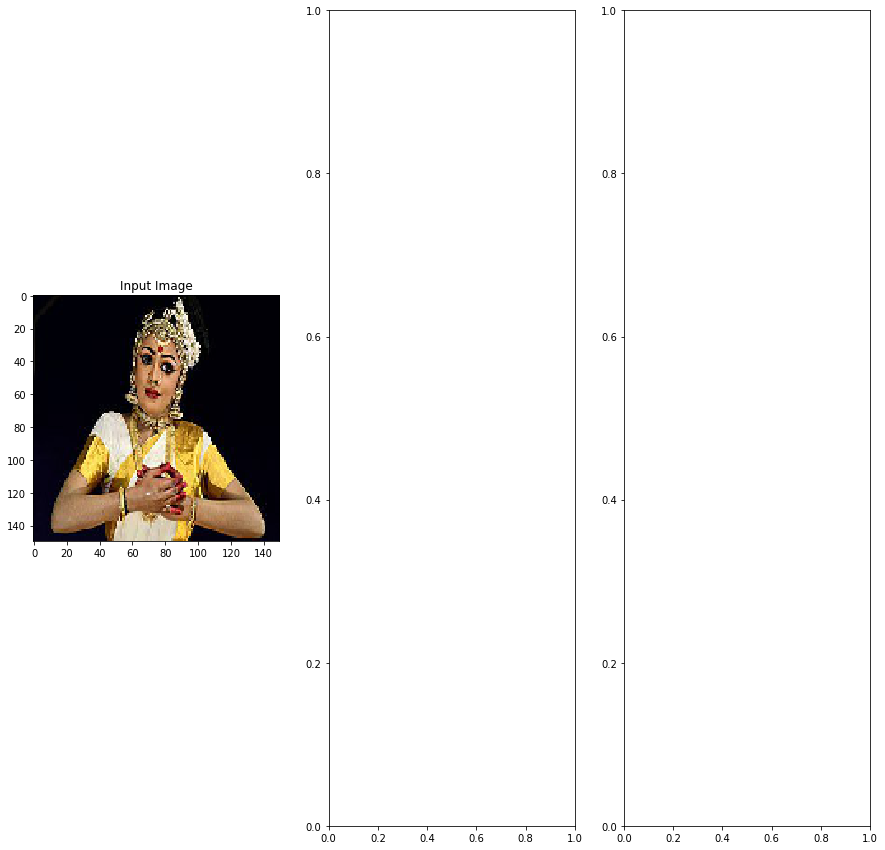

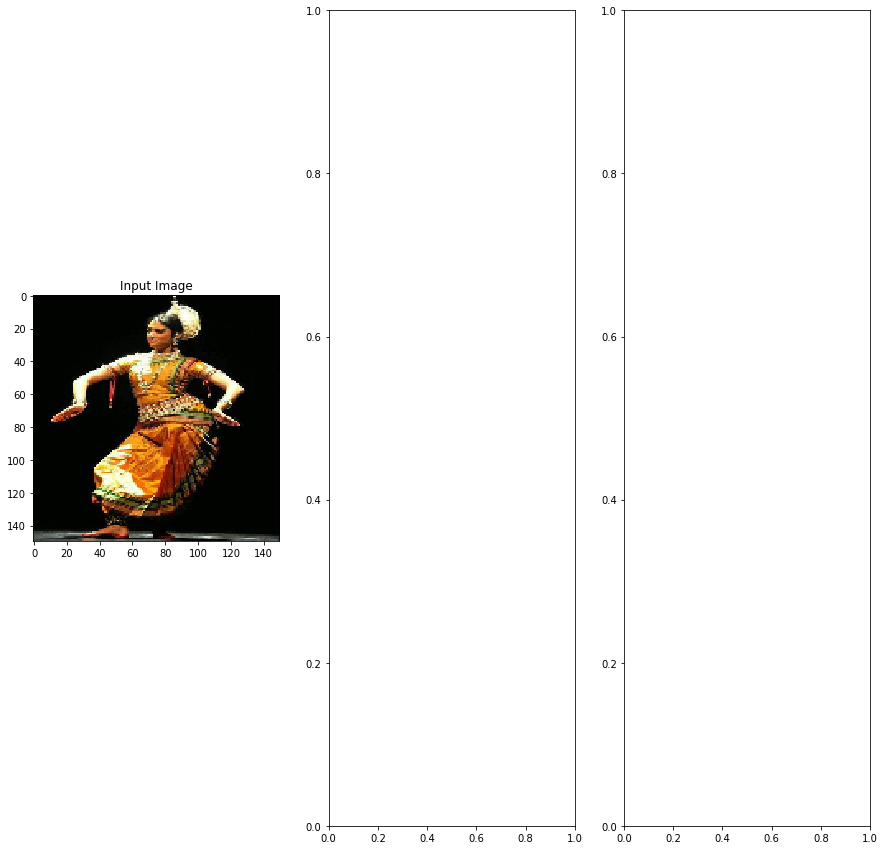

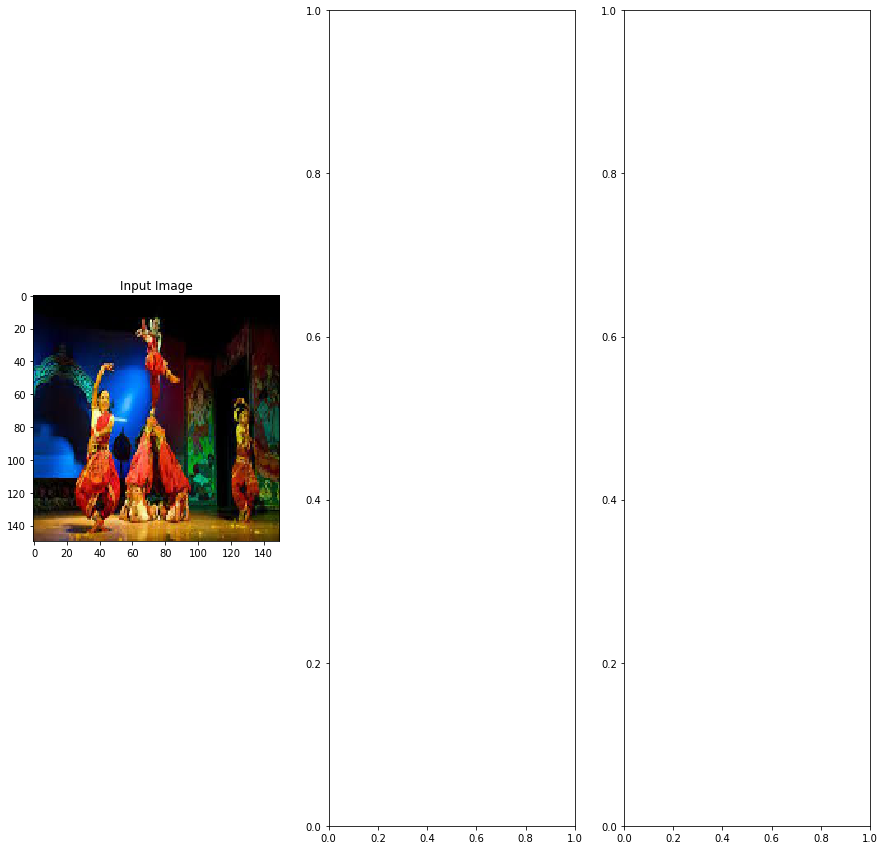

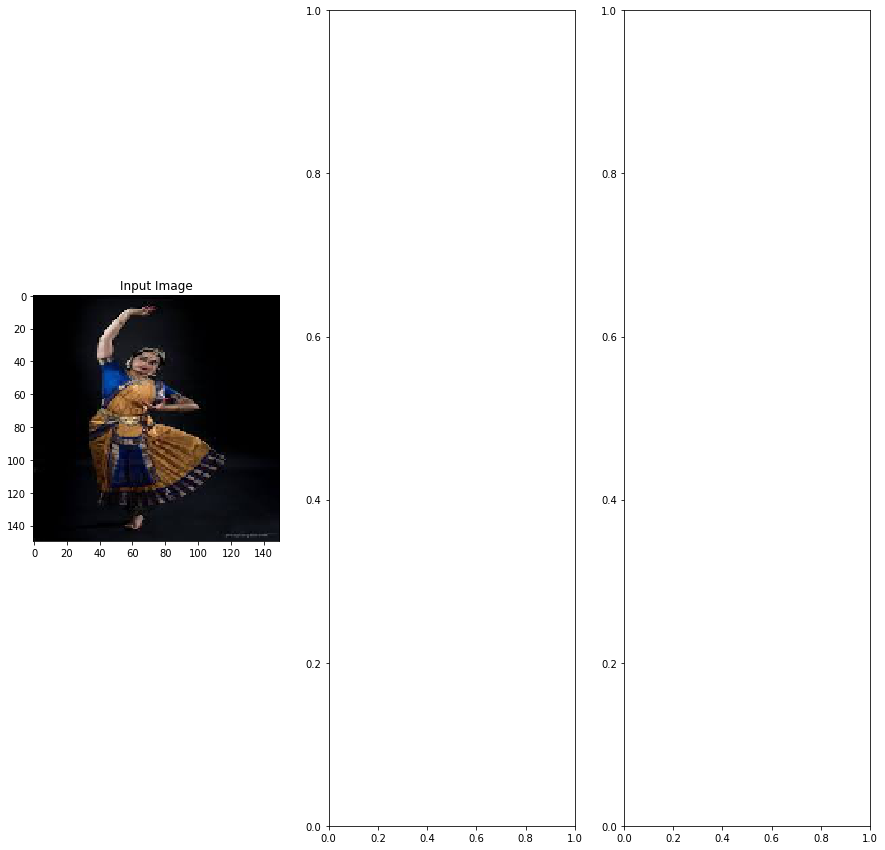

...

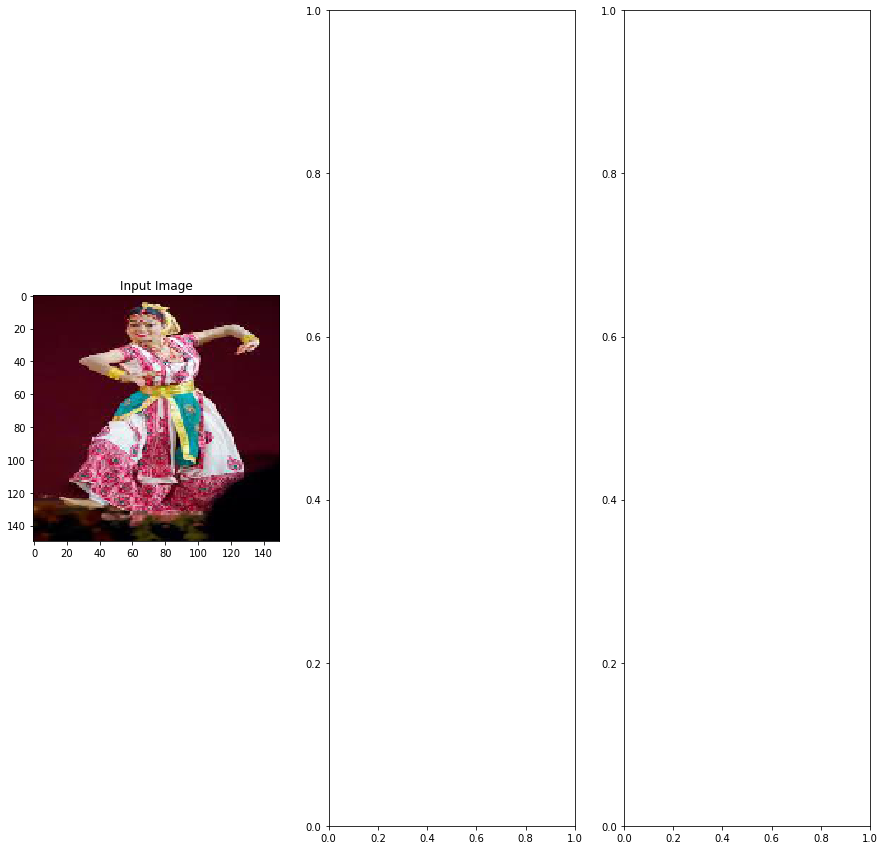

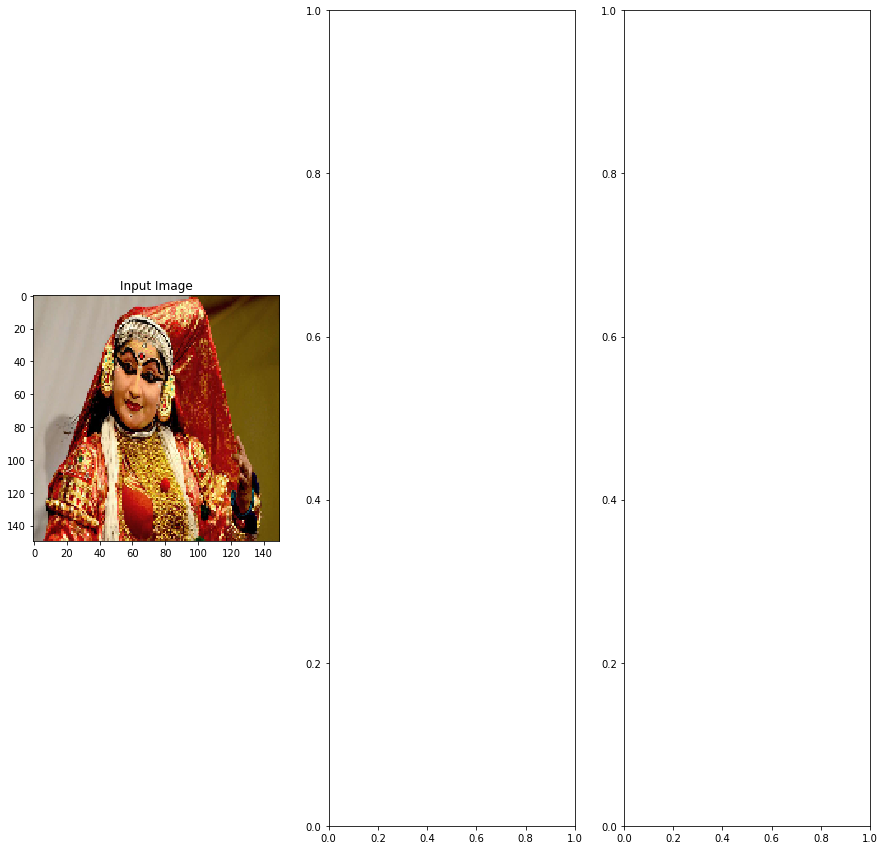

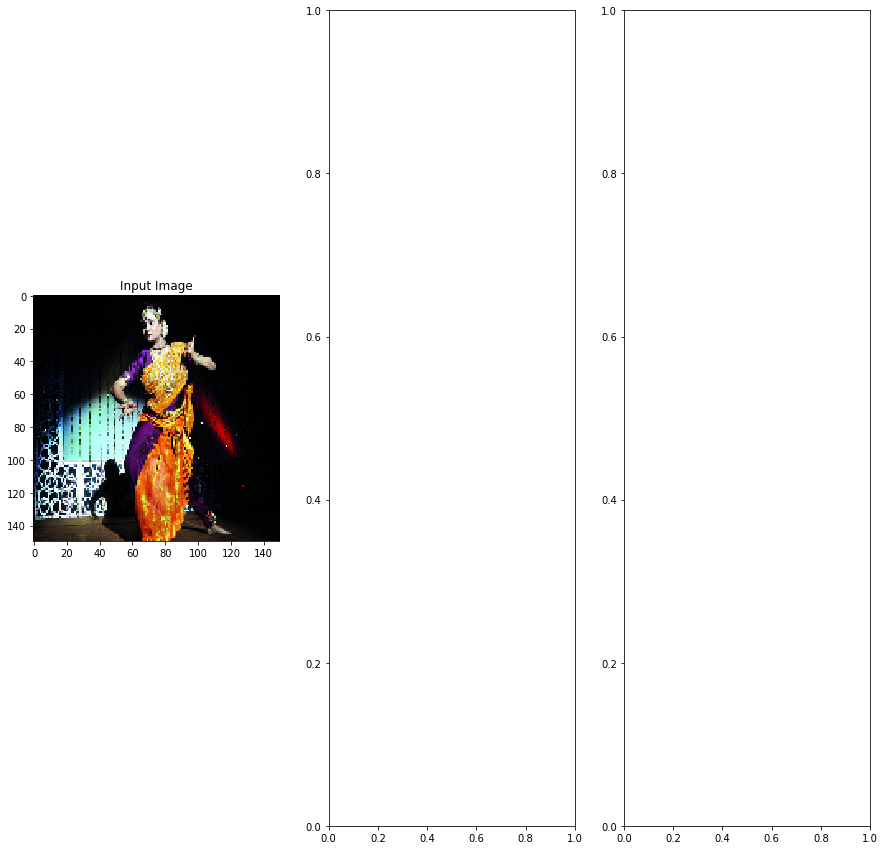

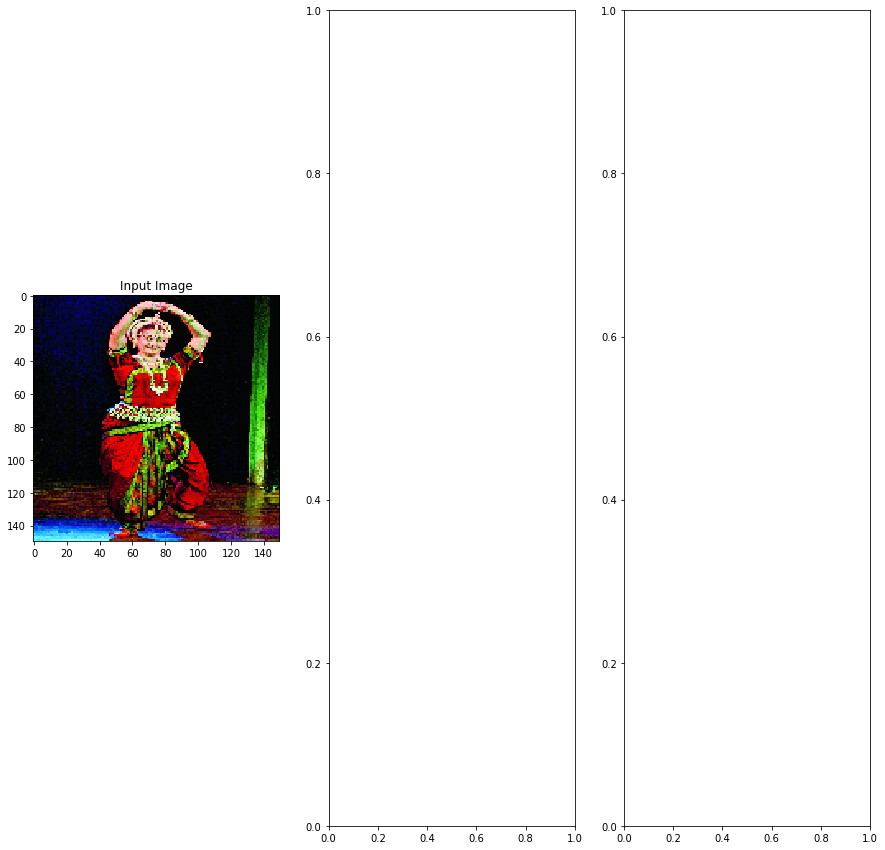

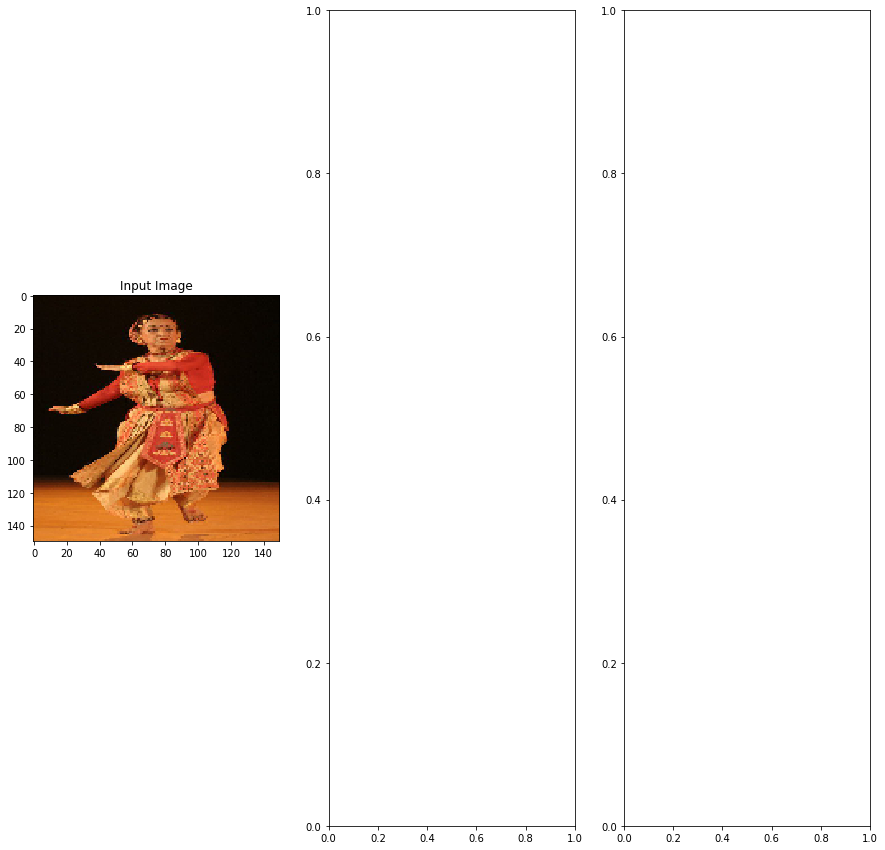

In [2]:
# Load the required Libraries


import tensorflow as tf
import matplotlib.image as img
import numpy as np
from collections import defaultdict
import collections
from shutil import copy
from shutil import copytree, rmtree
import tensorflow.keras.backend as K
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
import os
import random
from tensorflow.keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow import keras
from tensorflow.keras import models
import cv2
import matplotlib.image as mpimg
import PIL
import pandas as pd


import warnings
warnings.filterwarnings('ignore')


# Checking if GPU is enabled

# Check if GPU is enabled
print(tf.__version__)
print(tf.test.gpu_device_name())


# Setting up Location For the Directorys

dir_path=os.getcwd()
dir_path=dir_path.replace("\\","/")

# The path to the dataset Directory
base_directory=dir_path+'/dataset'

# The path to the training images directory
train_dir=base_directory+'/train'

# The path to the test images directory
test_dir=base_directory+'/test'

# Creating a list variable containing the names of all the images
test_csv_data=pd.read_csv(base_directory+'/test.csv')

predict_images_list=test_csv_data.Image.values.tolist()



train_csv_data=pd.read_csv(base_directory+'/train.csv')
dance_class_types=train_csv_data.target.unique().tolist()

#print(predict_images_list)
print(len(predict_images_list))




# Loading the created model from running the Model_Creator.py file.

# Loading the best saved model to make predictions
model = load_model('best_model_8class_InceptionResNetV2.hdf5',compile = False)

# Loading The Model Summary
model.summary()


# Predicting the values of test images




def get_attribution(food):
    img = image.load_img(food, target_size=(150, 150))
    img = image.img_to_array(img)
    img /= 255.
    f, ax = plt.subplots(1, 3, figsize=(15, 15))
    ax[0].imshow(img)
    img = np.expand_dims(img, axis=0)
    preds = model.predict(img)
    ax[0].set_title("Input Image")



    return preds





output_list=[]

for i in range(0,len(predict_images_list)):
    pred = get_attribution(test_dir+'/'+predict_images_list[i]).tolist()
    pred=pred[0]
    dance_form_id=pred.index(max(pred))
    print(pred.index(max(pred)))
    output_list.append([predict_images_list[i],dance_class_types[dance_form_id]])


dfObj = pd.DataFrame(output_list, columns = ['Image','target'])


dfObj.to_csv('test.csv',index=False)

